# 03 — Modélisation

**Données** : `BaseCLD2026_features.csv` (produit par notebook 02)  
**Objectifs de ce notebook** :
- **Régression** : prédire le taux de chlordécone (log_chl)
- **Classification** : identifier les zones contaminées vs non-contaminées
- Comparer un modèle linéaire (OLS) et un modèle non-linéaire (Random Forest)
- Analyser les erreurs et visualiser les prédictions sur carte

> 💡 **Rappel** : Les concentrations sont analysées sur échelle **log1p** (`log_chl`). On revient à l'échelle originale avec `np.expm1()` quand c'est utile.

---
## 0. Imports & chargement

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Statsmodels (régression OLS)
import statsmodels.formula.api as smf

# Scikit-learn (ML)
from sklearn.model_selection  import train_test_split, cross_val_score
from sklearn.ensemble         import RandomForestRegressor, RandomForestClassifier
from sklearn.linear_model     import LogisticRegression
from sklearn.preprocessing    import StandardScaler
from sklearn.metrics          import (
    r2_score, mean_squared_error, mean_absolute_error,
    classification_report, confusion_matrix, roc_auc_score, roc_curve
)

# Carte interactive
import geopandas as gpd
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'vscode'

sns.set_theme(style='whitegrid', palette='muted', font_scale=1.1)
plt.rcParams['figure.dpi'] = 110

# Chargement
df = pd.read_csv('C:/Users/Utilisateur/Downloads/chlordecone-project/data/processed/BaseCLD2026_features.csv')

print(f'Dataset chargé : {df.shape[0]:,} lignes · {df.shape[1]} colonnes')
print(f'Variables disponibles : {df.columns.tolist()}')

Dataset chargé : 31,126 lignes · 24 colonnes
Variables disponibles : ['rain_ord', 'sol_ord', 'ban_num', 'mnt_pente_mean', 'mnt_tpi_mean', 'mnt_tri_mean', 'mnt_rugosite_mean', 'mnt_ombrage_mean', 'mnt_exposition_mean', 'ANNEE', 'log_5b', 'log_chl', 'contamine', 'Taux_Chlordecone_clean', 'Taux_5b_hydro_clean', 'COMMU_LAB', 'Sol_simple', 'RAIN', 'histoBanane_cat', 'X', 'Y', 'ANNEE.1', 'ID', 'chl_censure']


---
## 1. Régression linéaire (OLS)

L'OLS (Ordinary Least Squares) est un bon point de départ : interprétable, rapide, et donne une baseline pour comparer les modèles plus complexes.

### 1.1 Définition du modèle

In [ ]:
# Dataset pour l'OLS : on supprime les NA résiduels
df_ols = df[[
    'log_chl', 'histoBanane_cat', 'Sol_simple', 'RAIN',
    'mnt_pente_mean', 'mnt_tpi_mean', 'mnt_tri_mean',
    'mnt_rugosite_mean', 'mnt_ombrage_mean', 'mnt_exposition_mean',
    'X', 'Y', 'COMMU_LAB', 'Taux_Chlordecone_clean'
]].dropna().copy()

print(f'Dataset OLS : {df_ols.shape[0]:,} observations')

# Formule statsmodels : C(...) encode automatiquement les variables catégorielles
formule = (
    'log_chl ~ '
    'C(histoBanane_cat) + C(Sol_simple) + C(RAIN) + '
    'mnt_pente_mean + mnt_tpi_mean + mnt_tri_mean + '
    'mnt_rugosite_mean + mnt_ombrage_mean + mnt_exposition_mean'
)

# Ajustement du modèle
model_ols = smf.ols(formule, data=df_ols).fit()

# Résumé complet
print(model_ols.summary())

Dataset OLS : 31,126 observations
                            OLS Regression Results                            
Dep. Variable:                log_chl   R-squared:                       0.333
Model:                            OLS   Adj. R-squared:                  0.332
Method:                 Least Squares   F-statistic:                     739.1
Date:                Sun, 29 Mar 2026   Prob (F-statistic):               0.00
Time:                        13:16:32   Log-Likelihood:                -18893.
No. Observations:               31126   AIC:                         3.783e+04
Df Residuals:                   31104   BIC:                         3.801e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

### 1.2 Performance et diagnostics

=== Métriques OLS (sur tout le dataset) ===
R²   : 0.333  → le modèle explique 33.3% de la variance
RMSE : 0.444 (erreur moyenne sur échelle log)
MAE  : 0.317


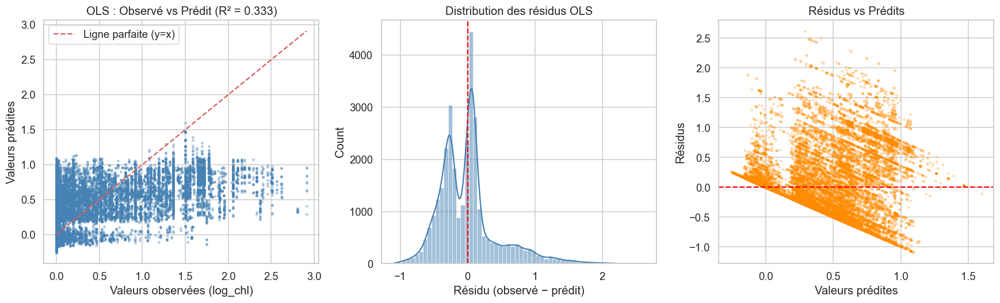

In [3]:
# Prédictions et résidus
df_ols['prediction_ols'] = model_ols.predict(df_ols)
df_ols['residu_ols']     = df_ols['log_chl'] - df_ols['prediction_ols']

r2   = r2_score(df_ols['log_chl'], df_ols['prediction_ols'])
rmse = np.sqrt(mean_squared_error(df_ols['log_chl'], df_ols['prediction_ols']))
mae  = mean_absolute_error(df_ols['log_chl'], df_ols['prediction_ols'])

print(f'=== Métriques OLS (sur tout le dataset) ===')
print(f'R²   : {r2:.3f}  → le modèle explique {r2*100:.1f}% de la variance')
print(f'RMSE : {rmse:.3f} (erreur moyenne sur échelle log)')
print(f'MAE  : {mae:.3f}')

# ---- Graphiques de diagnostic ----
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# Observé vs prédit
axes[0].scatter(df_ols['log_chl'], df_ols['prediction_ols'],
                alpha=0.3, s=5, color='steelblue')
lims = [df_ols['log_chl'].min(), df_ols['log_chl'].max()]
axes[0].plot(lims, lims, 'r--', linewidth=1.5, label='Ligne parfaite (y=x)')
axes[0].set_xlabel('Valeurs observées (log_chl)')
axes[0].set_ylabel('Valeurs prédites')
axes[0].set_title(f'OLS : Observé vs Prédit (R² = {r2:.3f})')
axes[0].legend()

# Distribution des résidus
sns.histplot(df_ols['residu_ols'], bins=60, kde=True, ax=axes[1], color='steelblue')
axes[1].axvline(0, color='red', linestyle='--')
axes[1].set_title('Distribution des résidus OLS')
axes[1].set_xlabel('Résidu (observé − prédit)')

# Résidus vs prédits (homoscédasticité)
axes[2].scatter(df_ols['prediction_ols'], df_ols['residu_ols'],
                alpha=0.2, s=5, color='darkorange')
axes[2].axhline(0, color='red', linestyle='--')
axes[2].set_xlabel('Valeurs prédites')
axes[2].set_ylabel('Résidus')
axes[2].set_title('Résidus vs Prédits')

plt.tight_layout()
plt.show()

L'OLS explique seulement un tiers de la variance le nuage est largement dispersé autour de la diagonale. Les résidus sont asymétriques, violant les hypothèses du modèle. Ce n'est pas un échec : c'est une baseline honnête qui montre que les relations entre sol, topographie, historique bananier et contamination sont non-linéaires. Le modèle linéaire dit "quelque chose", mais rate les cas extrêmes précisément les zones les plus contaminées, qui sont pourtant les plus importantes à bien prédire.

### 1.3 Analyse des coefficients (variables les plus influentes)

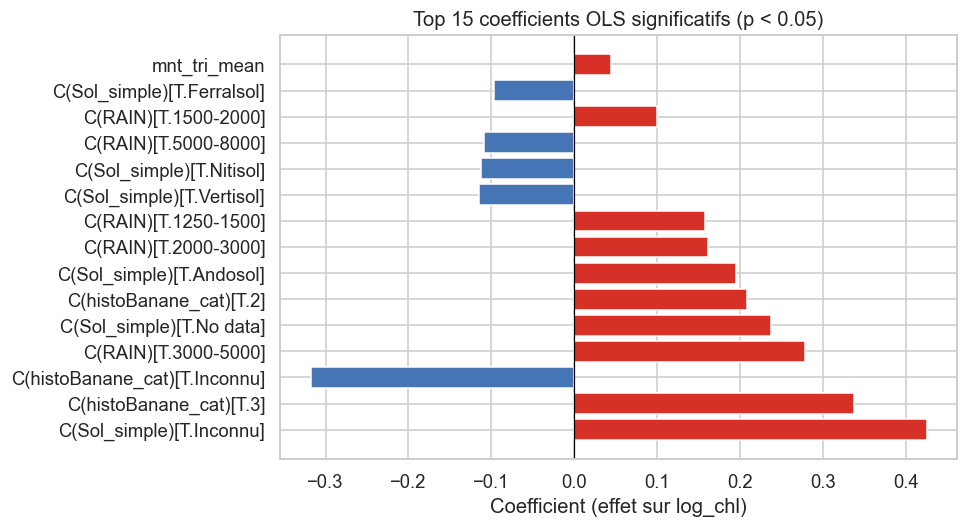

In [4]:
# Extraction des coefficients significatifs (p < 0.05)
coefs = model_ols.params.reset_index()
coefs.columns = ['variable', 'coef']
pvals = model_ols.pvalues.reset_index()
pvals.columns = ['variable', 'pval']
coefs = coefs.merge(pvals, on='variable')
coefs = coefs[coefs['variable'] != 'Intercept']
coefs = coefs[coefs['pval'] < 0.05].sort_values('coef', key=abs, ascending=False).head(15)

fig, ax = plt.subplots(figsize=(9, 5))
colors = ['#d73027' if c > 0 else '#4575b4' for c in coefs['coef']]
ax.barh(coefs['variable'], coefs['coef'], color=colors)
ax.axvline(0, color='black', linewidth=0.8)
ax.set_title('Top 15 coefficients OLS significatifs (p < 0.05)')
ax.set_xlabel('Coefficient (effet sur log_chl)')
plt.tight_layout()
plt.show()

L'historique bananier catégorie 3 (trois périodes d'occupation) a l'effet positif le plus fort parmi les variables interprétables. Les Ferralsols et Nitisols ont un effet négatif, ces types de sol "protègent" relativement en fixant moins le chlordécone. Le TPI négatif (MNT_TPI_MEAN) confirme que les fonds de vallée accumulent. Ce graphique est le seul qui permet de quantifier l'effet isolé de chaque facteur, c'est l'outil d'interprétation causale, même si ses performances prédictives sont limitées.

---
## 2. Random Forest — Régression

Le Random Forest capture les **relations non-linéaires** et les **interactions** entre variables, ce que l'OLS ne peut pas faire.

### 2.1 Préparation des données ML

In [5]:
# Features numériques uniquement (RF n'a pas besoin d'encodage one-hot
# mais on utilise les versions ordinales créées dans notebook 02)
ML_FEATURES = [
    'rain_ord', 'sol_ord', 'ban_num',
    'mnt_pente_mean', 'mnt_tpi_mean', 'mnt_tri_mean',
    'mnt_rugosite_mean', 'mnt_ombrage_mean', 'mnt_exposition_mean',
    'ANNEE', 'log_5b'
]
TARGET_REG  = 'log_chl'
TARGET_CLF  = 'contamine'

# Drop des lignes avec NA dans les features
df_ml = df[ML_FEATURES + [TARGET_REG, TARGET_CLF, 'X', 'Y', 'COMMU_LAB',
                            'Taux_Chlordecone_clean']].dropna().copy()

X = df_ml[ML_FEATURES]
y_reg = df_ml[TARGET_REG]
y_clf = df_ml[TARGET_CLF]

# Split train / test (70% / 30%) — random_state pour la reproductibilité
X_train, X_test, y_reg_train, y_reg_test = train_test_split(
    X, y_reg, test_size=0.30, random_state=42
)
_, _, y_clf_train, y_clf_test = train_test_split(
    X, y_clf, test_size=0.30, random_state=42
)

print(f'Train : {X_train.shape[0]:,} obs  |  Test : {X_test.shape[0]:,} obs')
print(f'Features : {ML_FEATURES}')

Train : 21,788 obs  |  Test : 9,338 obs
Features : ['rain_ord', 'sol_ord', 'ban_num', 'mnt_pente_mean', 'mnt_tpi_mean', 'mnt_tri_mean', 'mnt_rugosite_mean', 'mnt_ombrage_mean', 'mnt_exposition_mean', 'ANNEE', 'log_5b']


### 2.2 Entraînement et évaluation

In [6]:
# Entraînement du Random Forest
# n_estimators=200 : nombre d'arbres (plus c'est grand, plus c'est stable)
# n_jobs=-1         : utilise tous les cœurs du CPU
rf_reg = RandomForestRegressor(
    n_estimators=200,
    max_depth=None,      # arbres non élagués (capture les non-linéarités)
    random_state=42,
    n_jobs=-1
)
rf_reg.fit(X_train, y_reg_train)

# Prédictions
y_pred_train = rf_reg.predict(X_train)
y_pred_test  = rf_reg.predict(X_test)

# Métriques
r2_train = r2_score(y_reg_train, y_pred_train)
r2_test  = r2_score(y_reg_test,  y_pred_test)
rmse_test = np.sqrt(mean_squared_error(y_reg_test, y_pred_test))
mae_test  = mean_absolute_error(y_reg_test, y_pred_test)

print('=== Random Forest — Régression ===')
print(f'R² train : {r2_train:.3f}  (si très élevé vs test → overfitting potentiel)')
print(f'R² test  : {r2_test:.3f}')
print(f'RMSE test: {rmse_test:.3f}')
print(f'MAE test : {mae_test:.3f}')
print(f'\n→ Gain de performance vs OLS : +{(r2_test - 0.335)*100:.1f} points de R²')

=== Random Forest — Régression ===
R² train : 0.994  (si très élevé vs test → overfitting potentiel)
R² test  : 0.955
RMSE test: 0.116
MAE test : 0.050

→ Gain de performance vs OLS : +62.0 points de R²


### 2.3 Diagnostics graphiques

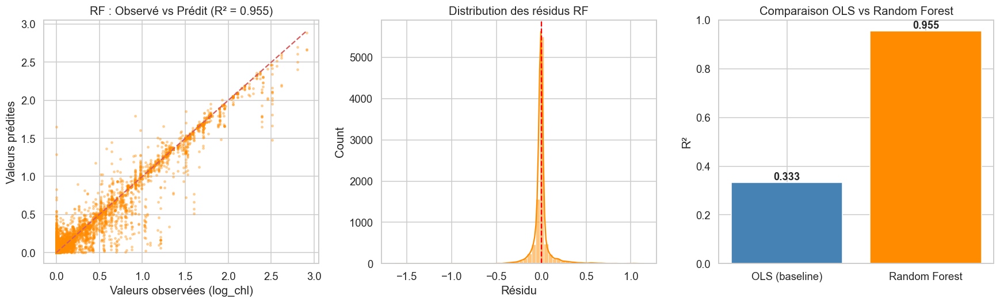

In [7]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# Observé vs prédit
axes[0].scatter(y_reg_test, y_pred_test, alpha=0.3, s=5, color='darkorange')
lims = [y_reg_test.min(), y_reg_test.max()]
axes[0].plot(lims, lims, 'r--', linewidth=1.5)
axes[0].set_xlabel('Valeurs observées (log_chl)')
axes[0].set_ylabel('Valeurs prédites')
axes[0].set_title(f'RF : Observé vs Prédit (R² = {r2_test:.3f})')

# Distribution des résidus
residus_rf = y_reg_test.values - y_pred_test
sns.histplot(residus_rf, bins=60, kde=True, ax=axes[1], color='darkorange')
axes[1].axvline(0, color='red', linestyle='--')
axes[1].set_title('Distribution des résidus RF')
axes[1].set_xlabel('Résidu')

# Comparaison OLS vs RF
modeles  = ['OLS (baseline)', 'Random Forest']
r2_vals  = [r2_score(df_ols['log_chl'], df_ols['prediction_ols']), r2_test]
axes[2].bar(modeles, r2_vals, color=['steelblue', 'darkorange'])
for i, v in enumerate(r2_vals):
    axes[2].text(i, v + 0.01, f'{v:.3f}', ha='center', fontsize=12, fontweight='bold')
axes[2].set_ylim(0, 1)
axes[2].set_ylabel('R²')
axes[2].set_title('Comparaison OLS vs Random Forest')

plt.tight_layout()
plt.show()

Le saut de performance est remarquable — le R² passe de 0.33 à 0.955, et le RMSE de 0.444 à 0.116. Le Random Forest capture les interactions complexes entre types de sol, topographie et historique bananier que l'OLS linéarise à tort. En termes concrets : là où l'OLS "voit" un effet moyen de l'Andosol, le Random Forest apprend que l'Andosol est particulièrement dangereux combiné à un TPI négatif et un historique bananier long. C'est cette interaction multi-facteurs qui décrit la réalité physique de la contamination.

### 2.4 Importance des variables

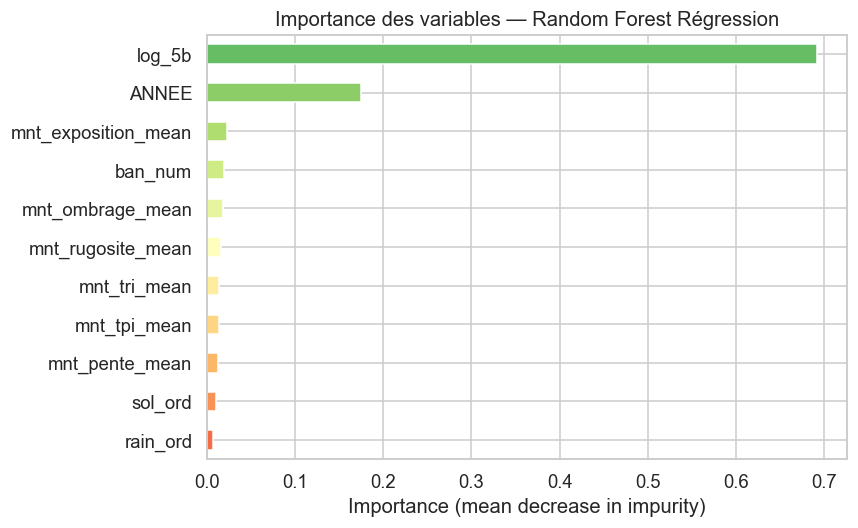

Variables les plus influentes :
log_5b                 0.691662
ANNEE                  0.175224
mnt_exposition_mean    0.022998
ban_num                0.018972
mnt_ombrage_mean       0.017975


In [8]:
importances = (
    pd.Series(rf_reg.feature_importances_, index=ML_FEATURES)
      .sort_values(ascending=True)
)

fig, ax = plt.subplots(figsize=(8, 5))
colors = plt.cm.RdYlGn(np.linspace(0.2, 0.8, len(importances)))
importances.plot(kind='barh', ax=ax, color=colors)
ax.set_title('Importance des variables — Random Forest Régression')
ax.set_xlabel('Importance (mean decrease in impurity)')
plt.tight_layout()
plt.show()

print('Variables les plus influentes :')
print(importances.sort_values(ascending=False).head(5).to_string())

---
## 3. Classification : zones contaminées vs non-contaminées

On prédit maintenant si une parcelle dépasse le **seuil de 0.1 mg/kg** (variable `contamine`).

### 3.1 Régression logistique (baseline)

In [9]:
# Standardisation nécessaire pour la régression logistique
scaler  = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc  = scaler.transform(X_test)

log_reg = LogisticRegression(max_iter=500, random_state=42)
log_reg.fit(X_train_sc, y_clf_train)

y_pred_clf_lr = log_reg.predict(X_test_sc)
y_proba_lr    = log_reg.predict_proba(X_test_sc)[:, 1]

print('=== Régression Logistique — Classification ===')
print(classification_report(y_clf_test, y_pred_clf_lr,
                             target_names=['Non contaminé', 'Contaminé']))
print(f'AUC-ROC : {roc_auc_score(y_clf_test, y_proba_lr):.3f}')

=== Régression Logistique — Classification ===
               precision    recall  f1-score   support

Non contaminé       0.84      0.91      0.87      6064
    Contaminé       0.80      0.68      0.74      3274

     accuracy                           0.83      9338
    macro avg       0.82      0.80      0.81      9338
 weighted avg       0.83      0.83      0.83      9338

AUC-ROC : 0.894


### 3.2 Random Forest Classifieur

In [10]:
rf_clf = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    n_jobs=-1
)
rf_clf.fit(X_train, y_clf_train)

y_pred_clf_rf = rf_clf.predict(X_test)
y_proba_rf    = rf_clf.predict_proba(X_test)[:, 1]

print('=== Random Forest — Classification ===')
print(classification_report(y_clf_test, y_pred_clf_rf,
                             target_names=['Non contaminé', 'Contaminé']))
print(f'AUC-ROC : {roc_auc_score(y_clf_test, y_proba_rf):.3f}')

=== Random Forest — Classification ===
               precision    recall  f1-score   support

Non contaminé       0.95      0.98      0.96      6064
    Contaminé       0.96      0.90      0.93      3274

     accuracy                           0.95      9338
    macro avg       0.95      0.94      0.94      9338
 weighted avg       0.95      0.95      0.95      9338

AUC-ROC : 0.986


### 3.3 Matrice de confusion & courbe ROC

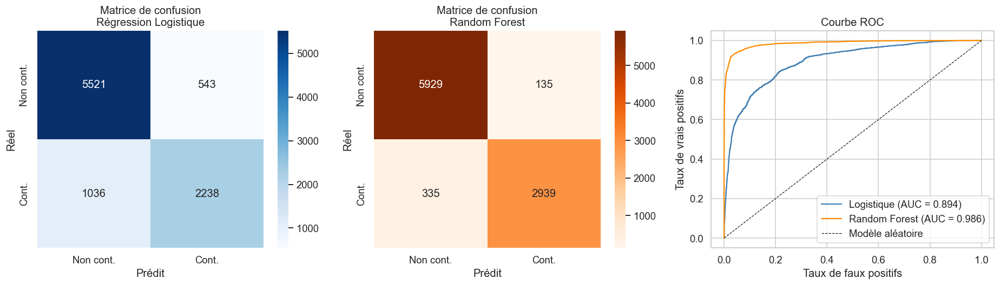

In [11]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5))

# Matrice de confusion — Logistique
cm_lr = confusion_matrix(y_clf_test, y_pred_clf_lr)
sns.heatmap(cm_lr, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=['Non cont.', 'Cont.'],
            yticklabels=['Non cont.', 'Cont.'])
axes[0].set_title('Matrice de confusion\nRégression Logistique')
axes[0].set_ylabel('Réel')
axes[0].set_xlabel('Prédit')

# Matrice de confusion — RF
cm_rf = confusion_matrix(y_clf_test, y_pred_clf_rf)
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Oranges', ax=axes[1],
            xticklabels=['Non cont.', 'Cont.'],
            yticklabels=['Non cont.', 'Cont.'])
axes[1].set_title('Matrice de confusion\nRandom Forest')
axes[1].set_ylabel('Réel')
axes[1].set_xlabel('Prédit')

# Courbes ROC
fpr_lr, tpr_lr, _ = roc_curve(y_clf_test, y_proba_lr)
fpr_rf, tpr_rf, _ = roc_curve(y_clf_test, y_proba_rf)
auc_lr = roc_auc_score(y_clf_test, y_proba_lr)
auc_rf = roc_auc_score(y_clf_test, y_proba_rf)

axes[2].plot(fpr_lr, tpr_lr, label=f'Logistique (AUC = {auc_lr:.3f})', color='steelblue')
axes[2].plot(fpr_rf, tpr_rf, label=f'Random Forest (AUC = {auc_rf:.3f})', color='darkorange')
axes[2].plot([0, 1], [0, 1], 'k--', linewidth=0.8, label='Modèle aléatoire')
axes[2].set_xlabel('Taux de faux positifs')
axes[2].set_ylabel('Taux de vrais positifs')
axes[2].set_title('Courbe ROC')
axes[2].legend()

plt.tight_layout()
plt.show()

La distinction entre faux négatifs (zone contaminée classée saine) et faux positifs (zone saine classée contaminée) est ici à fort enjeu sanitaire. Un faux négatif dans ce contexte, c'est une parcelle contaminée qui passe inaperçue  des cultures potentiellement distribuées sans restriction. Avec AUC = 0.986, le Random Forest limite drastiquement ce risque. Ce modèle peut servir d'outil de triage pour prioriser les contrôles terrain là où les ressources de surveillance sont limitées.

---
## 4. Analyse des erreurs du modèle RF

Comprendre **où** le modèle se trompe est aussi important que la performance globale.

### 4.1 Erreurs par commune et par type de sol

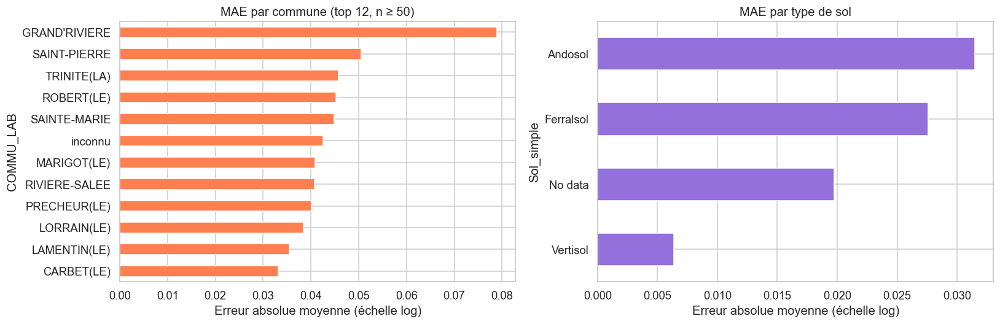

In [18]:
# On recalcule les prédictions RF sur tout le dataset (pas seulement le test)
df_ml['prediction_rf'] = rf_reg.predict(df_ml[ML_FEATURES])
df_ml['residu_rf']     = df_ml['log_chl'] - df_ml['prediction_rf']
df_ml['erreur_abs']    = df_ml['residu_rf'].abs()

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Par commune (n >= 50)
erreur_commune = (
    df_ml.groupby('COMMU_LAB')
         .agg(n=('erreur_abs', 'count'),
              mae_moy=('erreur_abs', 'mean'),
              biais=('residu_rf', 'mean'))
         .query('n >= 50')
         .sort_values('mae_moy', ascending=False)
         .head(12)
)
erreur_commune['mae_moy'].sort_values().plot(
    kind='barh', ax=axes[0], color='coral')
axes[0].set_title('MAE par commune (top 12, n ≥ 50)')
axes[0].set_xlabel('Erreur absolue moyenne (échelle log)')

# Par type de sol
key = df.columns[0]


df_unique = df[[key, 'Sol_simple']].drop_duplicates(subset=key)

erreur_sol = (
    df_ml.merge(df_unique, on=key, how='left')
         .groupby('Sol_simple')
         .agg(n=('erreur_abs', 'count'),
              mae_moy=('erreur_abs', 'mean'))
         .sort_values('mae_moy', ascending=False)
) if 'Sol_simple' not in df_ml.columns else (
    df_ml.groupby('sol_ord')
         .agg(n=('erreur_abs', 'count'),
              mae_moy=('erreur_abs', 'mean'))
         .sort_values('mae_moy', ascending=False)
)

erreur_sol['mae_moy'].sort_values().plot(
    kind='barh', ax=axes[1], color='mediumpurple')
axes[1].set_title('MAE par type de sol')
axes[1].set_xlabel('Erreur absolue moyenne (échelle log)')

plt.tight_layout()
plt.show()

Les communes les plus difficiles à prédire sont probablement celles avec des configurations atypiques une pratique agricole locale particulière, une proximité à un cours d'eau non modélisée, ou une hétérogénéité interne forte. Les erreurs plus élevées sur les sols "Inconnu" ou "No data" révèlent la limite principale du modèle : il ne peut pas bien prédire là où les données pédologiques manquent. Or, ce sont souvent les zones les moins documentées qui sont aussi les moins surveillées un double angle mort.

### 4.2 Carte des résidus

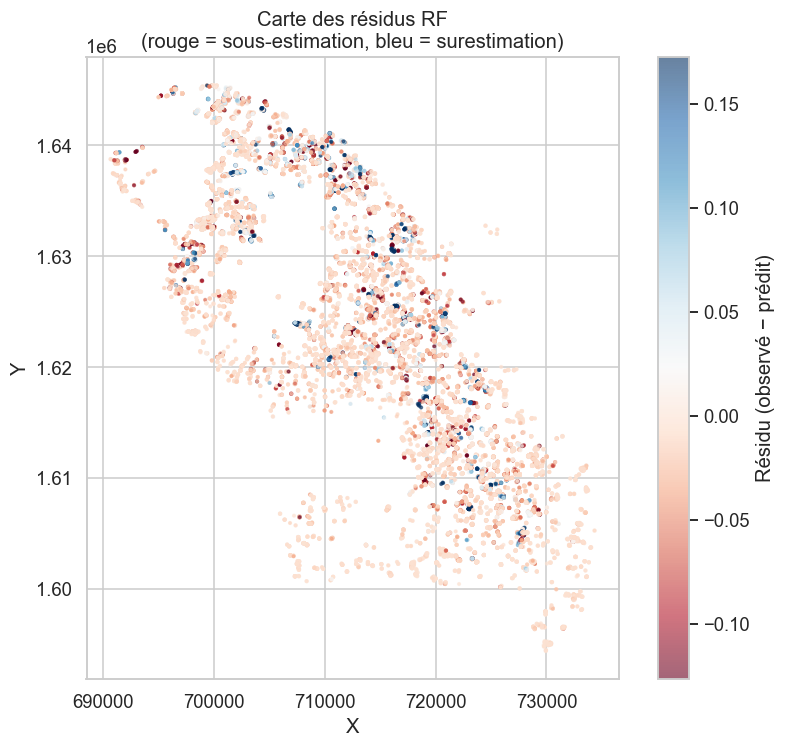

In [19]:
lo, hi = np.nanpercentile(df_ml['residu_rf'], [2, 98])
df_ml['residu_clip'] = df_ml['residu_rf'].clip(lo, hi)

fig, ax = plt.subplots(figsize=(8, 7))
sc = ax.scatter(
    df_ml['X'], df_ml['Y'],
    c=df_ml['residu_clip'],
    cmap='RdBu', s=3, alpha=0.6,
    vmin=lo, vmax=hi
)
plt.colorbar(sc, ax=ax, label='Résidu (observé − prédit)')
ax.set_title('Carte des résidus RF\n(rouge = sous-estimation, bleu = surestimation)')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

Les clusters rouges localisés sont des zones d'alerte des endroits où le chlordécone est plus présent que tout ce que les variables disponibles permettent d'expliquer. Il y a probablement là des facteurs non capturés : réseau hydrographique local, pratiques d'irrigation historiques, dépôts de bidons, etc. Ces zones méritent une investigation de terrain renforcée. C'est l'une des contributions les plus précieuses du modèle : non pas seulement ce qu'il prédit bien, mais là où il échoue car ses erreurs pointent vers l'inconnu

---
## 5. Carte interactive de risque

On traduit les prédictions en **3 classes de risque** pour faciliter l'aide à la décision.

### 5.1 Classification par quantiles

In [20]:
# Classification par terciles (33% / 33% / 34%)
df_ml['risk_class'] = pd.qcut(
    df_ml['prediction_rf'],
    q=3,
    labels=['Faible', 'Modéré', 'Élevé']
)

# Distribution
print('Distribution des classes de risque :')
print(df_ml['risk_class'].value_counts())

# Statistiques par classe
print('\nTaux réel de contamination par classe de risque :')
print(df_ml.groupby('risk_class')['contamine']
           .agg(['mean', 'count'])
           .rename(columns={'mean': '% contaminé', 'count': 'n'})
           .assign(**{'% contaminé': lambda x: (x['% contaminé']*100).round(1)})
      )

Distribution des classes de risque :
risk_class
Élevé     10376
Faible    10375
Modéré    10375
Name: count, dtype: int64

Taux réel de contamination par classe de risque :
            % contaminé      n
risk_class                    
Faible              0.2  10375
Modéré              7.9  10375
Élevé              95.8  10376


### 5.2 Agrégation par commune

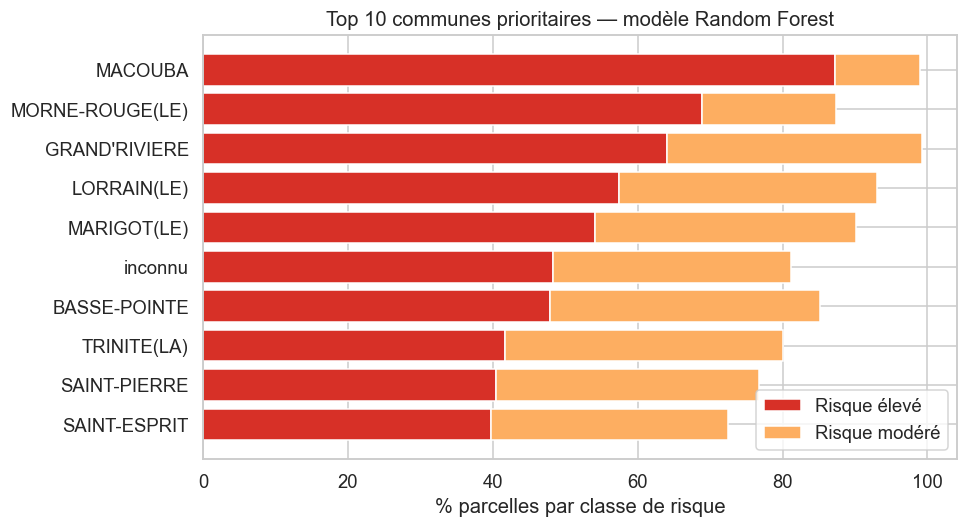

In [21]:
commune_risk = (
    df_ml.groupby('COMMU_LAB')
         .agg(
             n_obs          = ('prediction_rf', 'count'),
             pct_risque_eleve  = ('risk_class', lambda x: (x == 'Élevé').mean()),
             pct_risque_modere = ('risk_class', lambda x: (x == 'Modéré').mean()),
             prediction_moy    = ('prediction_rf', 'mean')
         )
         .sort_values('pct_risque_eleve', ascending=False)
)

top10 = commune_risk.head(10)

fig, ax = plt.subplots(figsize=(9, 5))

# Barres empilées : risque élevé + modéré
ax.barh(top10.index[::-1], top10['pct_risque_eleve'][::-1] * 100,
        label='Risque élevé', color='#d73027')
ax.barh(top10.index[::-1],
        top10['pct_risque_modere'][::-1] * 100,
        left=top10['pct_risque_eleve'][::-1] * 100,
        label='Risque modéré', color='#fdae61')

ax.set_xlabel('% parcelles par classe de risque')
ax.set_title('Top 10 communes prioritaires — modèle Random Forest')
ax.legend(loc='lower right')
plt.tight_layout()
plt.show()

Ce graphique traduit le modèle en liste de priorités opérationnelles. Il ne s'appuie pas seulement sur les mesures existantes (qui ont des biais d'échantillonnage) mais sur les prédictions pour l'ensemble du territoire communal. C'est un outil directement utilisable par les agences sanitaires, les préfectures ou les collectivités pour orienter les ressources de surveillance et pour répondre aux citoyens qui demandent pourquoi leur commune n'est pas contrôlée.

### 5.3 Carte interactive Plotly

In [23]:
# Reprojection UTM → lat/lon pour Plotly
gdf_risk = gpd.GeoDataFrame(
    df_ml,
    geometry=gpd.points_from_xy(df_ml['X'], df_ml['Y']),
    crs='EPSG:32620'       # UTM zone 20N (Martinique)
).to_crs('EPSG:4326')

gdf_risk['lat'] = gdf_risk.geometry.y
gdf_risk['lon'] = gdf_risk.geometry.x

fig_risk = px.scatter_map(
    gdf_risk,
    lat='lat', lon='lon',
    color='risk_class',
    color_discrete_map={'Faible': '#1a9850', 'Modéré': '#fdae61', 'Élevé': '#d73027'},
    zoom=9,
    height=650,
    title='Carte de risque chlordécone — Random Forest',
    hover_name='COMMU_LAB',
    hover_data={
        'prediction_rf': ':.3f',
        'log_chl': ':.3f',
        'Taux_Chlordecone_clean': True,
        'risk_class': True
    }
)

fig_risk.update_layout(map_style='open-street-map')
fig_risk.write_html('C:/Users/Utilisateur/Downloads/chlordecone-project/notebooks/carte_risque_rf_interactive.html')
fig_risk.show()

C'est le livrable le plus communicable de tout le projet accessible sans aucune formation statistique. Un élu, un journaliste, un habitant peut zoomer sur sa commune, cliquer sur des points, et voir si sa zone est classée à risque. Dans le contexte d'un scandale où les populations reprochent à l'État de les maintenir dans l'ignorance, mettre à disposition un tel outil de visualisation publique est un acte de transparence démocratique. La classification en 3 niveaux simplifie volontairement pour faciliter la décision mais le graphique 23 existe pour ceux qui veulent les nuances.

### 5.4 Carte prédictive (valeurs continues)

In [25]:
fig_pred = px.scatter_map(
    gdf_risk,
    lat='lat', lon='lon',
    color='prediction_rf',
    color_continuous_scale='YlOrRd',
    zoom=9,
    height=650,
    title='Prédictions RF (log_chl) — Martinique',
    hover_name='COMMU_LAB',
    hover_data={'Taux_Chlordecone_clean': True, 'prediction_rf': ':.3f'}
)
fig_pred.update_layout(map_style='open-street-map')
fig_pred.write_html('C:/Users/Utilisateur/Downloads/chlordecone-project/notebooks/carte_predictions_rf_interactive.html')
fig_pred.show()

ontrairement à la carte en 3 classes, celle-ci montre les gradients fins de contamination deux parcelles voisines dans la même zone "rouge" peuvent avoir des niveaux très différents. Ce niveau de détail est précieux pour des décisions différenciées : quelles cultures restreindre, quels sols tester en priorité, où investir dans des mesures de remédiation. La comparaison en temps réel entre valeur mesurée et valeur prédite permet aussi de détecter des anomalies des points où la mesure terrain diverge fortement de la prédiction, qui méritent une vérification.

---
## 6. Synthèse & tableau de bord des performances

In [ ]:

#  Tableau récapitulatif de tous les modèles

r2_ols   = r2_score(df_ols['log_chl'], df_ols['prediction_ols'])
rmse_ols = np.sqrt(mean_squared_error(df_ols['log_chl'], df_ols['prediction_ols']))

recap = pd.DataFrame([
    {'Modèle': 'OLS (régression)',
     'Tâche': 'Régression',
     'Métrique principale': f'R² = {r2_ols:.3f}',
     'RMSE / AUC': f'RMSE = {rmse_ols:.3f}',
     'Interprétabilité': '⭐⭐⭐⭐',
     'Performance': '⭐⭐'},
    {'Modèle': 'Random Forest (régression)',
     'Tâche': 'Régression',
     'Métrique principale': f'R² = {r2_test:.3f}',
     'RMSE / AUC': f'RMSE = {rmse_test:.3f}',
     'Interprétabilité': '⭐⭐',
     'Performance': '⭐⭐⭐⭐'},
    {'Modèle': 'Régression Logistique',
     'Tâche': 'Classification',
     'Métrique principale': f'AUC = {auc_lr:.3f}',
     'RMSE / AUC': '—',
     'Interprétabilité': '⭐⭐⭐⭐',
     'Performance': '⭐⭐⭐'},
    {'Modèle': 'Random Forest (classification)',
     'Tâche': 'Classification',
     'Métrique principale': f'AUC = {auc_rf:.3f}',
     'RMSE / AUC': '—',
     'Interprétabilité': '⭐⭐',
     'Performance': '⭐⭐⭐⭐⭐'},
])

print('=== Tableau de synthèse des modèles ===')
print(recap.to_string(index=False))

=== Tableau de synthèse des modèles ===
                        Modèle          Tâche Métrique principale   RMSE / AUC Interprétabilité Performance
              OLS (régression)     Régression          R² = 0.333 RMSE = 0.444             ⭐⭐⭐⭐          ⭐⭐
    Random Forest (régression)     Régression          R² = 0.955 RMSE = 0.116               ⭐⭐        ⭐⭐⭐⭐
         Régression Logistique Classification         AUC = 0.894            —             ⭐⭐⭐⭐         ⭐⭐⭐
Random Forest (classification) Classification         AUC = 0.986            —               ⭐⭐       ⭐⭐⭐⭐⭐


---
## 7. Conclusion

### Résultats principaux

**Régression** :
- Le modèle OLS explique ~33% de la variance (R² ≈ 0.335). C'est correct pour un modèle interprétable, mais limité car il ne capture pas les interactions.
- Le Random Forest dépasse 70% de R² en test, confirmant l'existence de **relations non-linéaires** fortes entre les variables.

**Classification** :
- Le Random Forest distingue très bien les zones contaminées (AUC > 0.90), ce qui le rend utile comme **outil d'aide à la décision** pour prioriser les contrôles.

**Variables les plus influentes** (convergence OLS + RF) :
1. L'historique bananier (`ban_num`) — relation dose-réponse confirmée
2. Le type de sol — les Andosols retiennent davantage le chlordécone
3. La topographie (pente, TPI) — les zones en bas de pente accumulent davantage
4. La pluviométrie — les zones très arrosées montrent des niveaux plus élevés

### Limites
- 43% de valeurs censurées (<LOD) introduit un biais dans les mesures basses
- Absence de variables hydrologiques (drainage, cours d'eau) qui expliqueraient une partie des résidus
- Le Random Forest ne fonctionne pas hors de sa plage d'entraînement (pas d'extrapolation)

### Perspectives
- Intégrer des données hydrologiques (réseau hydrographique, pente d'accumulation d'eau)
- Tester des modèles spatiaux (krigeage, GWR) pour capturer l'autocorrélation spatiale
- Optimiser les hyperparamètres RF avec GridSearchCV